In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import math
%matplotlib ipympl

In [25]:
dfNN = pd.read_csv("data/randXNormalYNormal.csv", delimiter=";")
dfUN = pd.read_csv("data/randXUniformYNormal.csv", delimiter=";")
dfNE = pd.read_csv("data/randXNormalYExponential.csv", delimiter=";")
dfUE = pd.read_csv("data/randXUniformYExponential.csv", delimiter=";")
dfNP = pd.read_csv("data/randXNormalYPoisson.csv", delimiter=";")
dfUP = pd.read_csv("data/randXUniformYPoisson.csv", delimiter=";")
dfNU = pd.read_csv("data/randXNormalYUniform.csv", delimiter=";")
dfUU = pd.read_csv("data/randXUniformYUniform.csv", delimiter=";")
dfNNS = pd.read_csv("data/randXNormalYNormalSame.csv", delimiter=";")
dfNNU = pd.read_csv("data/randXNormalYNormaUnbounded.csv", delimiter=";")

dfs = [
    (dfNN, "Normal x Normal"),
    (dfUN, "Uniform x Normal"),
    (dfNE, "Normal x Exponential"),
    (dfUE, "Uniform x Exponential"),
    (dfNP, "Normal x Poisson"),
    (dfUP, "Uniform x Poisson"),
    (dfNU, "Normal x Uniform"),
    (dfUU, "Uniform x Uniform"),
    (dfNNS, "Normal x Normal Same"),
    (dfNNU, "Normal x Normal Unbounded"),
]

In [26]:
def extractFromColumnByN(df, columnName, ns):
    minC = []
    maxC = []
    meanC = []
    medianC = []
    stdC = []
    varC = []
    for n in ns:
        column = df.loc[df.n == n][columnName]
        minC.append(column.min())
        maxC.append(column.max())
        meanC.append(column.mean())
        medianC.append(column.median())
        stdC.append(column.std())
        varC.append(column.var())
        
    return minC, maxC, meanC, medianC, stdC, varC

In [27]:
def extractFromColumnByN(df, columnName, ns):
    minC = []
    maxC = []
    meanC = []
    medianC = []
    stdC = []
    varC = []
    for n in ns:
        column = df.loc[df.n == n][columnName]
        minC.append(column.min())
        maxC.append(column.max())
        meanC.append(column.mean())
        medianC.append(column.median())
        stdC.append(column.std())
        varC.append(column.var())
        
    return minC, maxC, meanC, medianC, stdC, varC

In [28]:
def chebyshev(data, percent):
        EX = sum([abs(dat) for dat in data]) / (len(data)- 1)
        VarX = sum([(dat - EX) ** 2 for dat in data]) / (len(data) - 1)
        return math.sqrt(VarX/ percent)

def markov(data, percent):
        EX = sum([abs(dat) for dat in data]) / (len(data)- 1)
        return EX / percent

def getUpperAndLower(data, percent):
    sortedData = sorted(data)
    return sortedData[int(percent * len(data))], sortedData[-(int(percent * len(data)) + 1)]

In [29]:
def plotWithAll(cheby, markov, mean, median, min, max, real, ax, ns, title):
    lowerReal = list(map(lambda x: x[1], real))
    upperReal = list(map(lambda x: x[0], real))
    chebyLow = [mean[i] - cheby[i] for i in range(len(ns))]
    chebyHigh = [mean[i] + cheby[i] for i in range(len(ns))]
    markovLow = [mean[i] - markov[i] for i in range(len(ns))]
    markovHigh = [mean[i] + markov[i] for i in range(len(ns))]
    # ax.plot(ns, lowerReal, label = "lower real")
    # ax.plot(ns, upperReal, label = "upper real")
    ax.plot(ns, chebyLow, label = "lower chebyshev")
    ax.plot(ns, chebyHigh, label = "upper chebyshev")
    # ax.plot(ns, markovLow, label = "lower markov")
    # ax.plot(ns, markovHigh, label = "upper markov")
    ax.plot(ns, mean, label="Real")
    ax.plot(ns, min, label="Min")
    ax.plot(ns, median, label="Median")
    ax.plot(ns, max, label="Max")
    ax.legend()
    ax.set_title(title)

In [30]:
def plotConcentration(df, type, plotTitle, ax):
    percent = 0.2
    ns = df.n.unique()
    minRes, maxRes, meanRes, medianRes, stdRes, varRes = extractFromColumnByN(df, type, ns)
    cheby = [chebyshev(df.loc[df.n == n][type], percent) for n in ns]
    mrkv = [markov(df.loc[df.n == n][type], percent) for n in ns]
    real = [getUpperAndLower(df.loc[df.n == n][type], percent) for n in ns]

    plotWithAll(cheby, mrkv, meanRes, medianRes, minRes, maxRes, real, ax, ns, plotTitle)

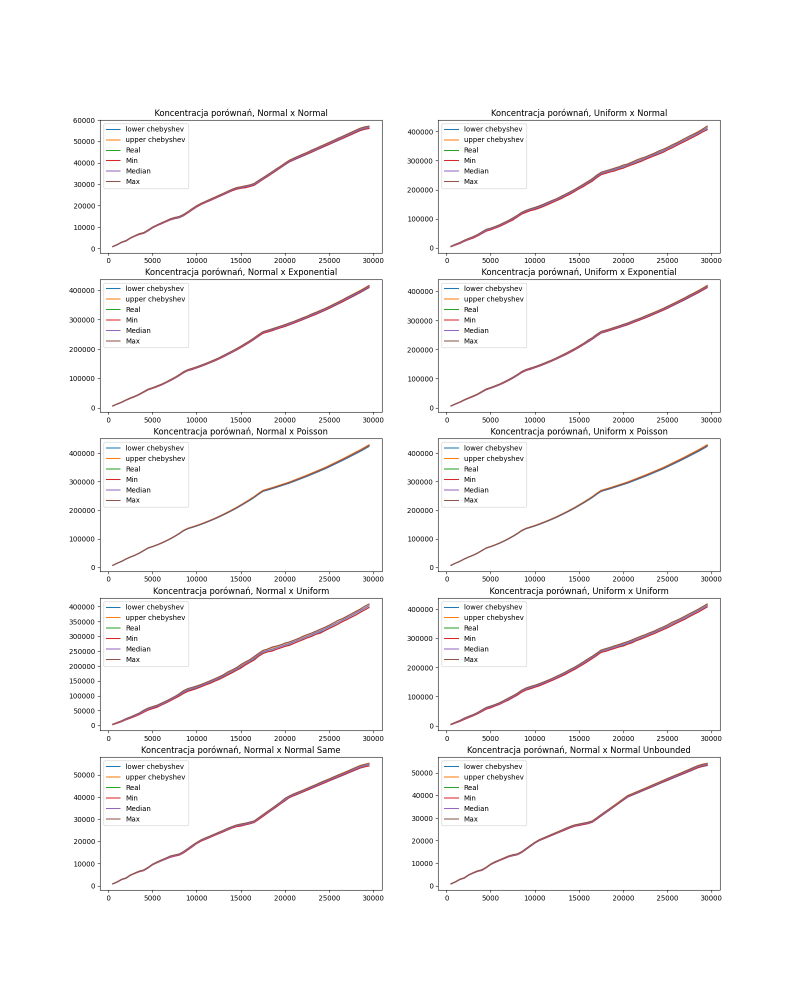

In [31]:
plt.close()
fig, axs = plt.subplots(5, 2,  figsize=(16, 20))
for i, (df, name) in enumerate(dfs):
    plotConcentration(df, "c", f"Koncentracja porównań, {name}", axs[i//2][i%2])  


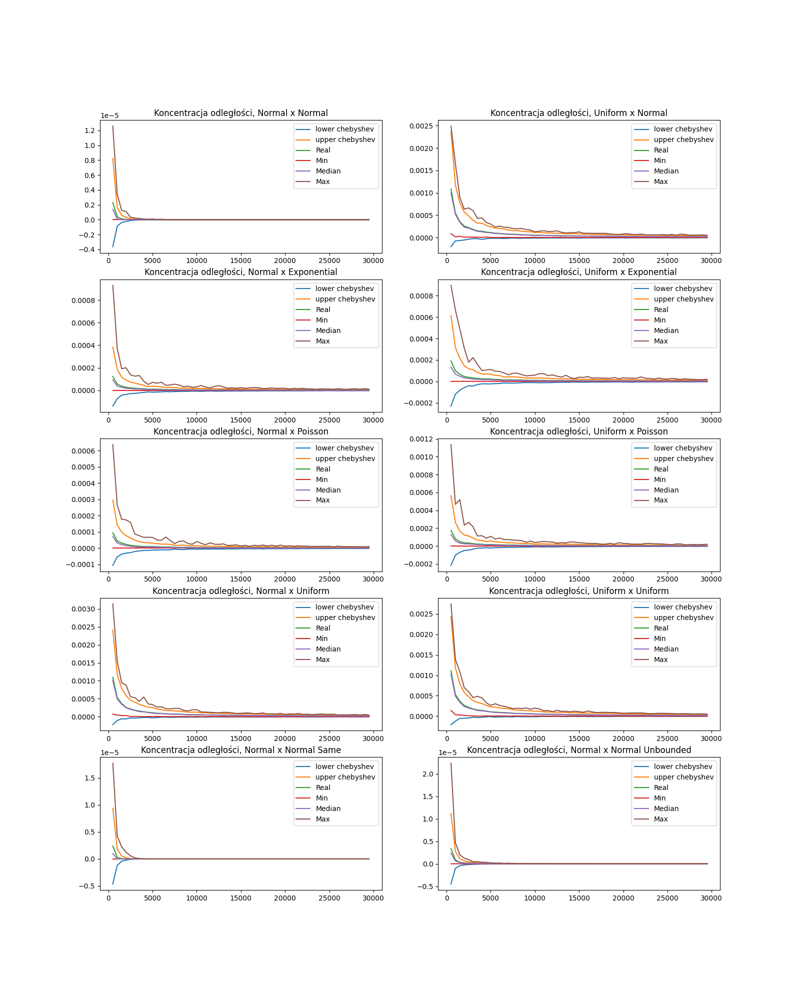

In [32]:
plt.close()
fig, axs = plt.subplots(5, 2,  figsize=(16, 20))
for i, (df, name) in enumerate(dfs):
    plotConcentration(df, "d", f"Koncentracja odległości, {name}", axs[i//2][i%2])  

In [33]:
def plotHey(df, type, title, ax, func):
    percent = 0.2
    ns = df.n.unique()
    minRes, maxRes, meanRes, medianRes, stdRes, varRes = extractFromColumnByN(df, type, ns)
    funcNs = [func(n) for n in ns]
    newMin = [x / z for (x, z) in zip(minRes, funcNs)]
    newAvg = [x / z for (x, z) in zip(meanRes, funcNs)]
    newMax = [x / z for (x, z) in zip(maxRes, funcNs)]
    ax.set_title(title)
    ax.plot(ns, newMin, label="Min")
    ax.plot(ns, newAvg, label="Avg")
    ax.plot(ns, newMax, label="Max")

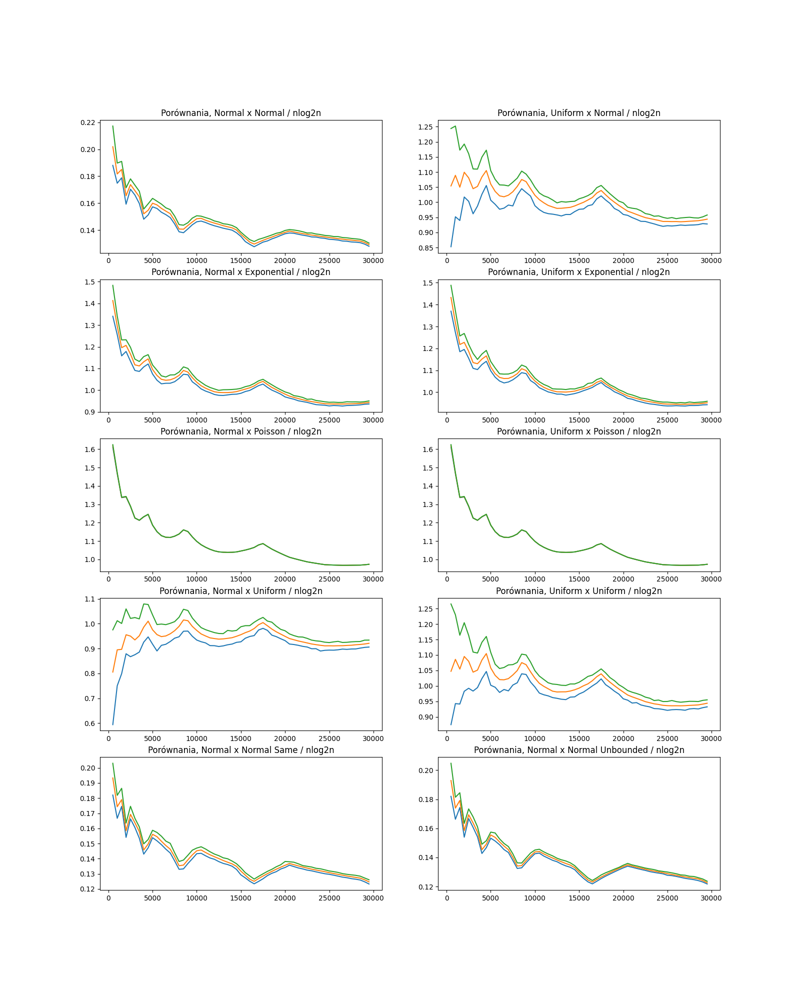

In [34]:
plt.close()
fig1, axs = plt.subplots(5, 2,  figsize=(16, 20))
for i, (df, name) in enumerate(dfs):
    plotHey(df, "c", f"Porównania, {name} / nlog2n", axs[i//2][i%2], lambda x: x * math.log(x, 2))  


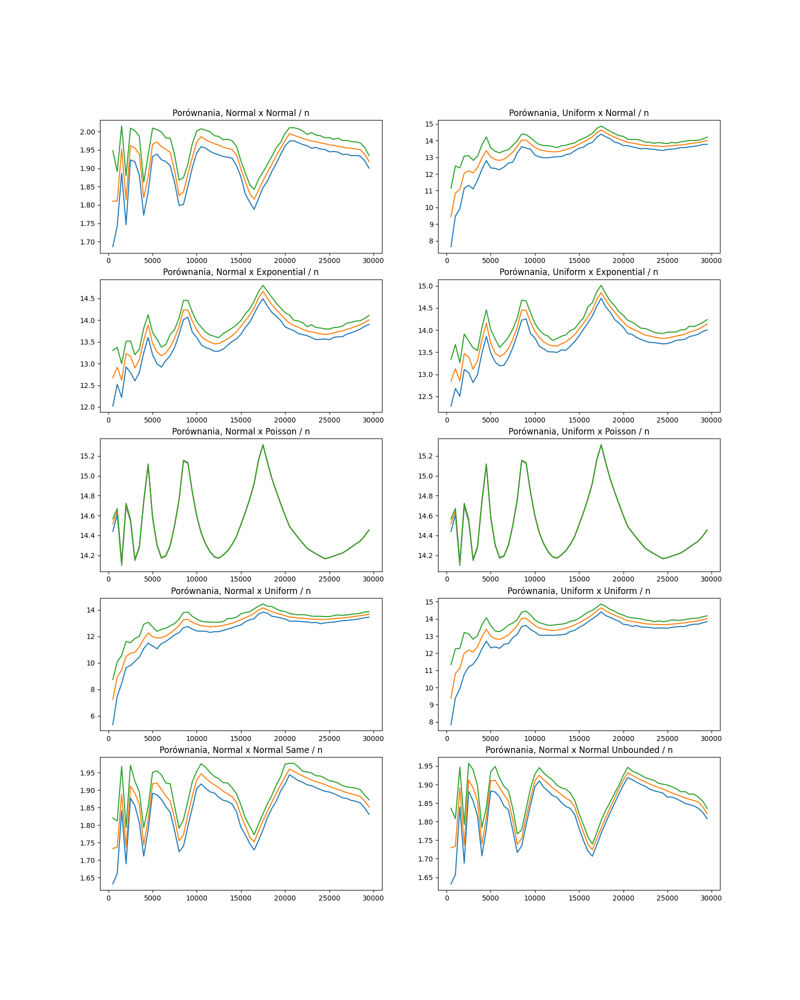

In [35]:
plt.close()
fig2, axs = plt.subplots(5, 2,  figsize=(16, 20))
for i, (df, name) in enumerate(dfs):
    plotHey(df, "c", f"Porównania, {name} / n", axs[i//2][i%2], lambda x: x)  


In [36]:
def print3DHist(dataFrame, distro, type, name):
    bin_edges = np.linspace(min(dataFrame[type]), max(dataFrame[type]), 20)
    
    # Prepare grid for x (rounds), y (n values)
    X, Y = np.meshgrid(bin_edges, np.unique(dataFrame['n']))
    
    # Initialize Z grid (frequencies) with zeros
    Z = np.zeros_like(X)
    
    # Calculate frequency for each unique 'n'
    for i, n in enumerate(np.unique(dataFrame['n'])):
        hist, _ = np.histogram(dataFrame[dataFrame['n'] == n][type], bins=bin_edges)
        Z[i, :len(hist)] = hist
    
    # Create a 3D plot
    fig = plt.figure(figsize=(15, 5))
    ax = fig.add_subplot(121, projection='3d')
    
    ax.set_xlabel(f'Liczba {name}')
    ax.set_ylabel('N')
    ax.set_zlabel(f'Liczba {name} w przedziale')
    ax.set_title(f'Rozkłady gęstości porównań w zależności od N = {distro}')
    # Create the surface plot
    ax.plot_surface(X, Y, Z, cmap='viridis')

    # ax2 = fig.add_subplot(122)
    # plotConcentration(dataFrame, type, f"Koncentracja rozmiaru, rozkład {distro}", ax2)  
    # plt.show()
    

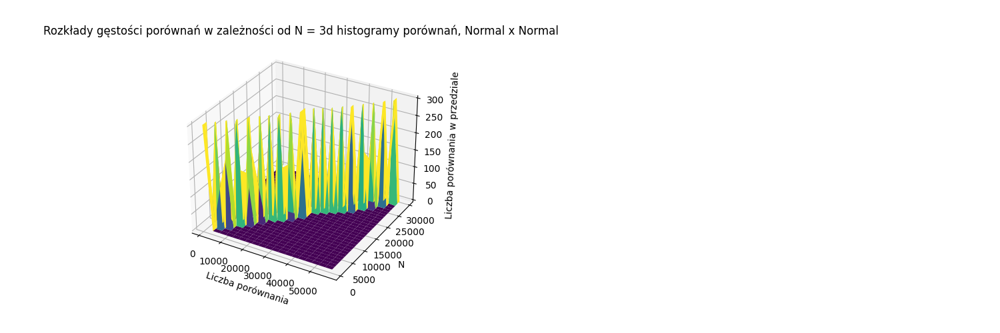

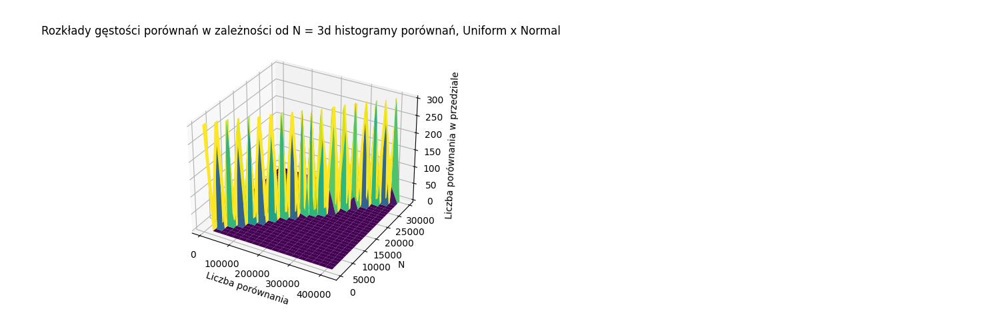

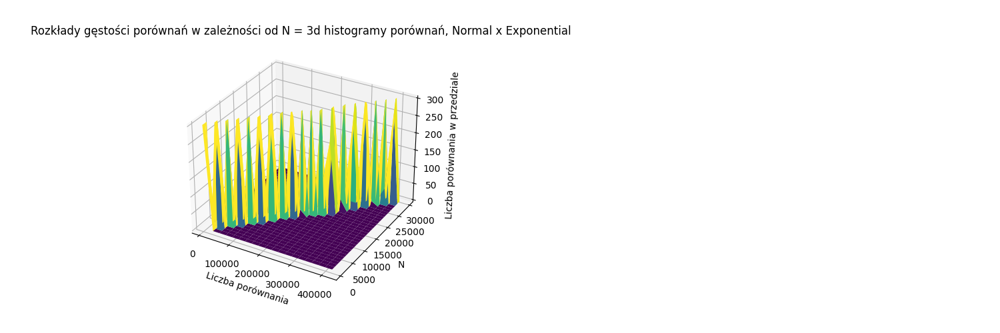

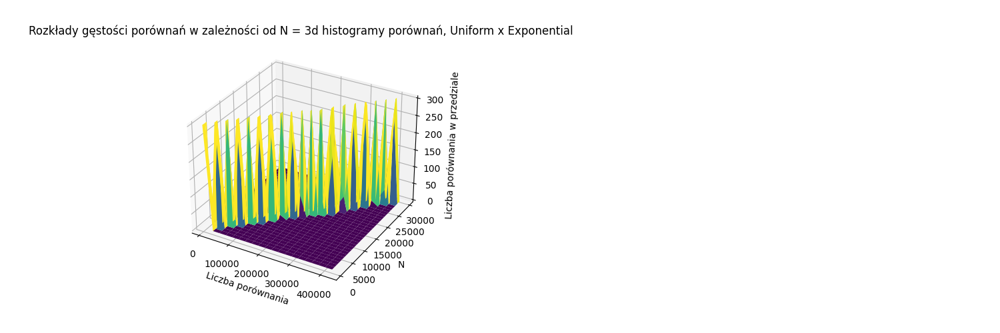

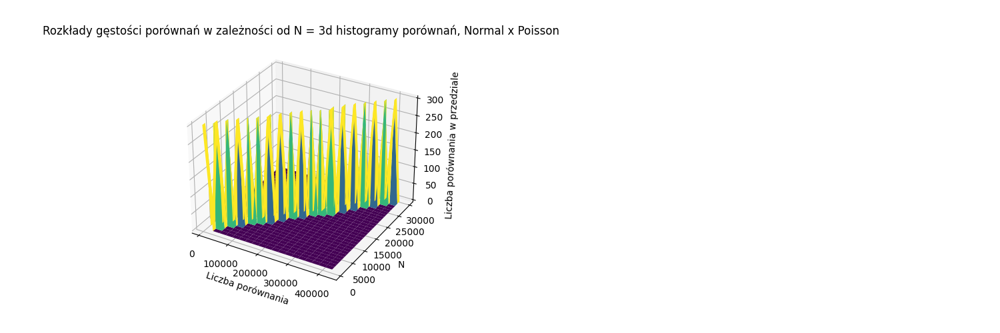

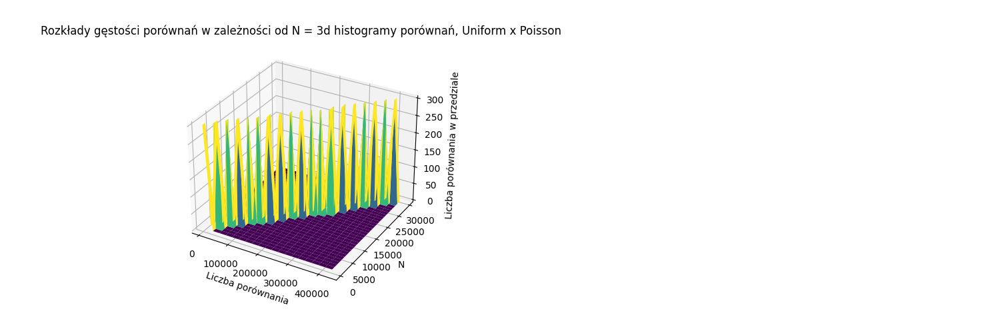

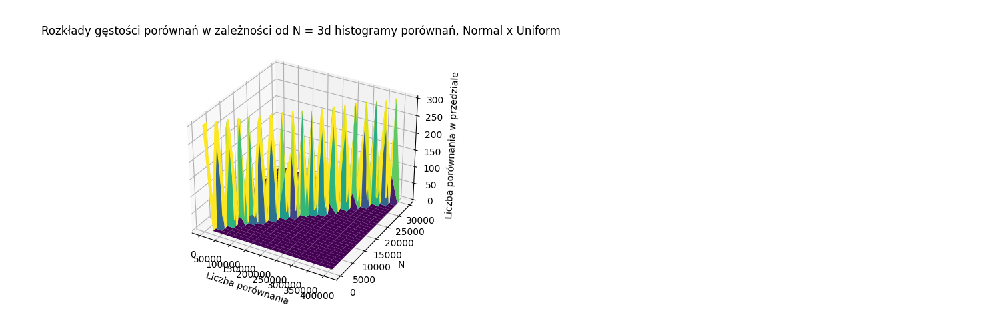

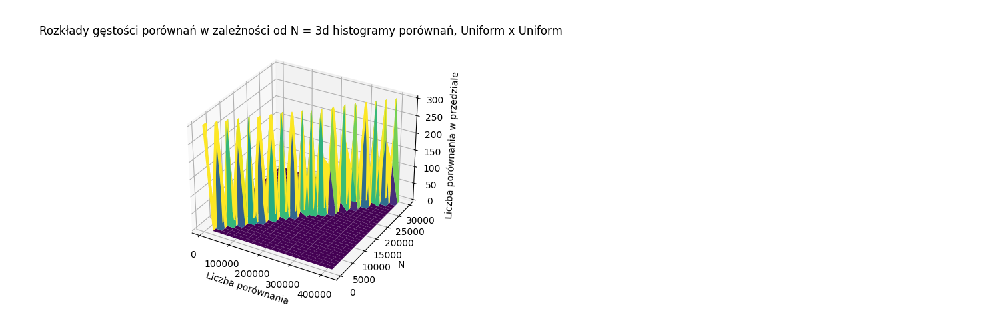

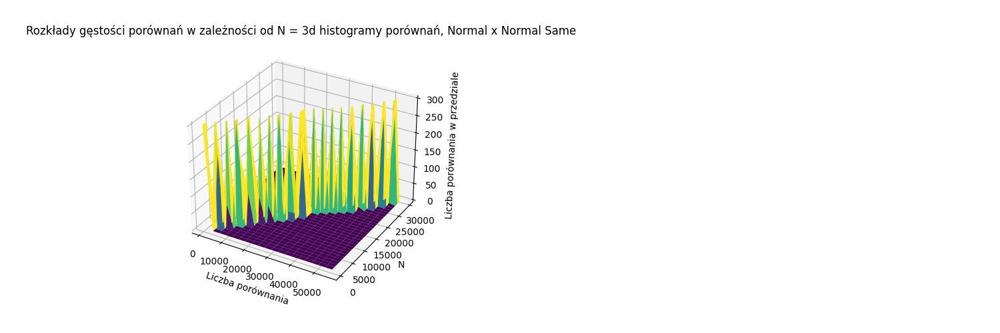

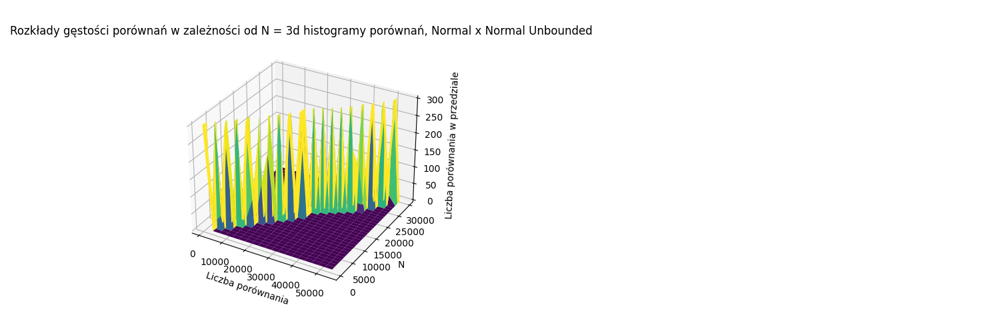

In [37]:
plt.close()
for i, (df, name) in enumerate(dfs):
    print3DHist(df, f"3d histogramy porównań, {name}", "c", "porównania")  


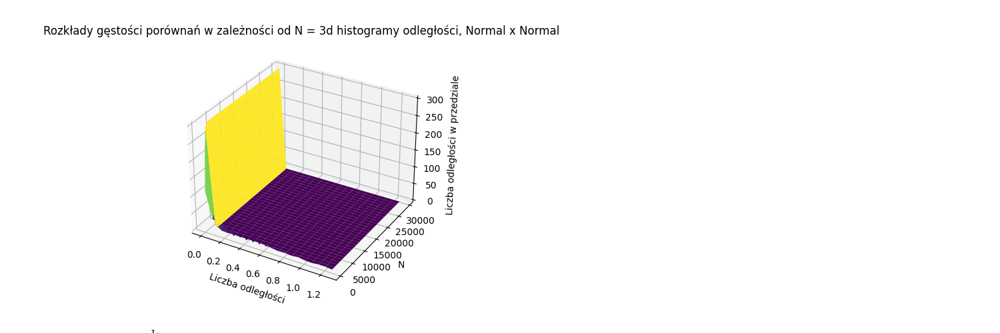

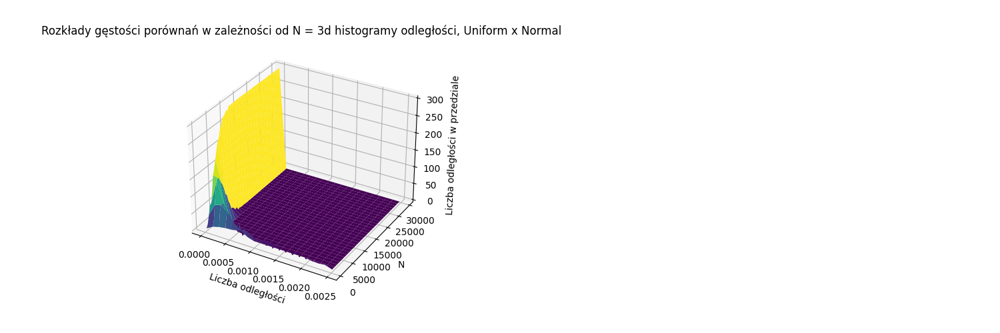

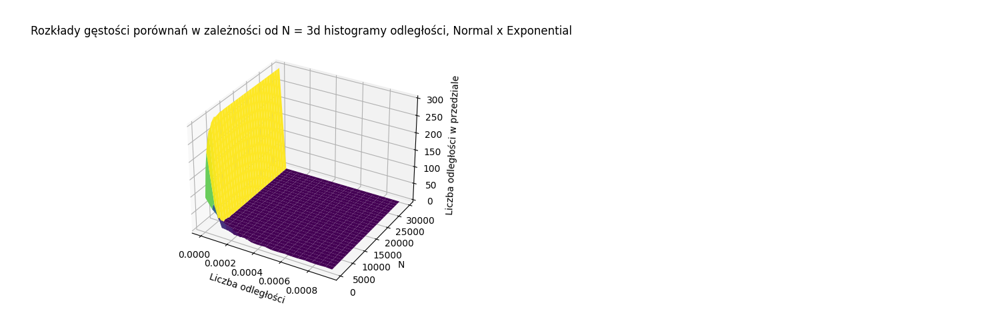

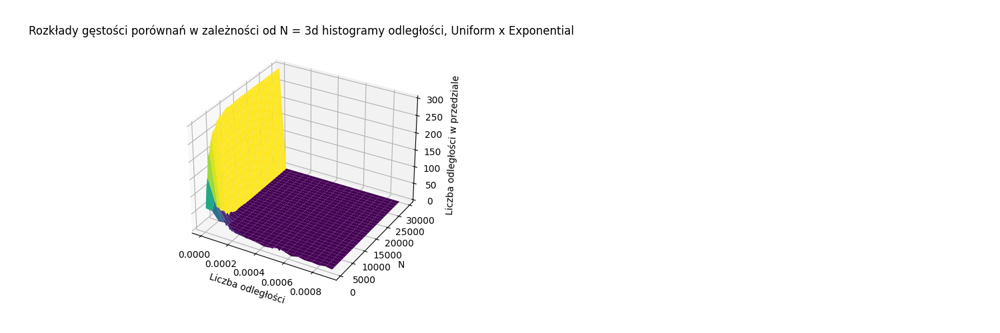

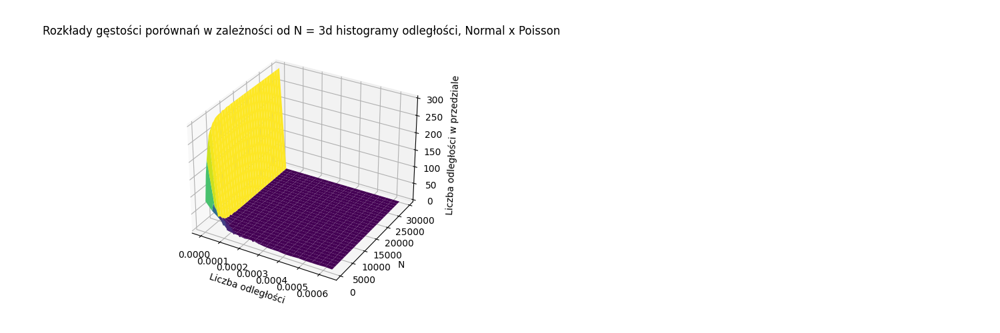

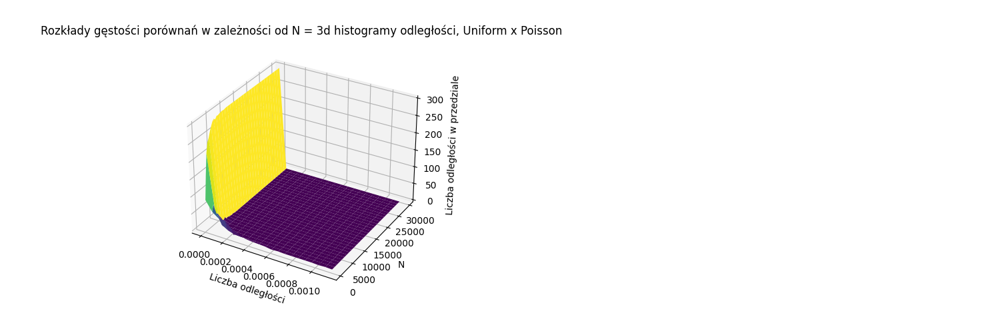

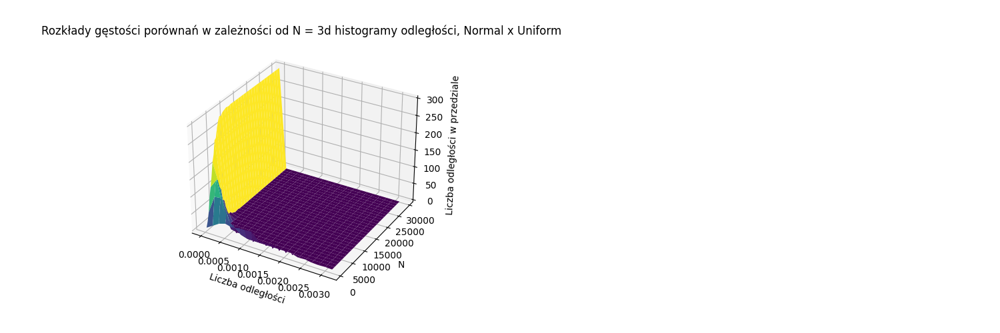

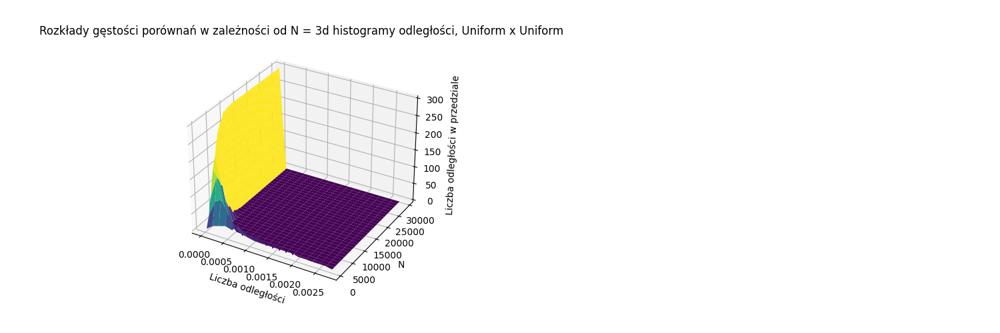

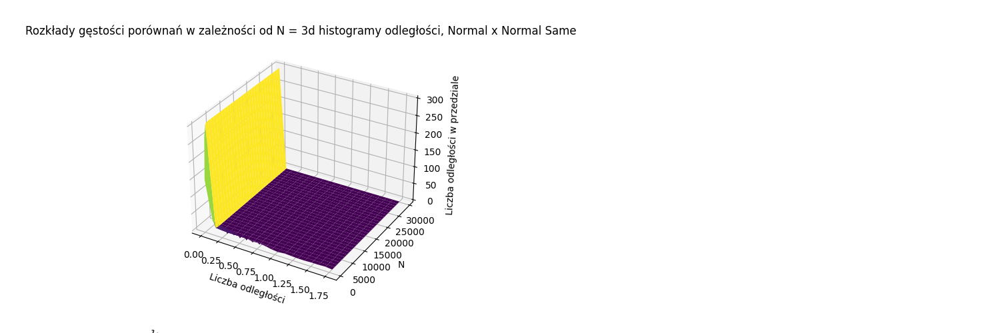

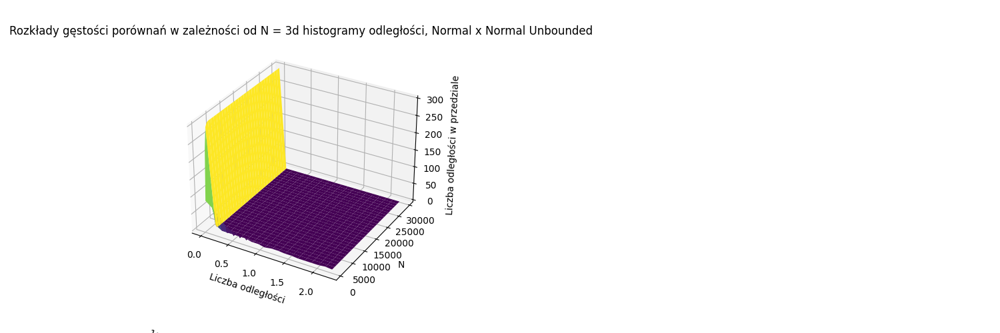

In [38]:
plt.close()
for i, (df, name) in enumerate(dfs):
    print3DHist(df, f"3d histogramy odległości, {name}", "d", "odległości")  
